In [8]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import sys
import pathlib
sys.path.append(os.path.join(str(pathlib.Path().resolve()), '../lib'))
from fancy_plot import *
import pickle
import numpy as np
import glob
import tensorflow as tf
from tensorflow import keras
sys.path.append('/home/b/b309233/software/VPRM_preprocessor/neural_network/')
import model02
import copy
from keras.models import load_model
import matplotlib.pyplot as plt
from matplotlib.cbook import get_sample_data

def to_flxnet_date(time):
    return np.int64('{}{:02d}{:02d}{:02d}{:02d}'.format(time.year, time.month, time.day,
                                                        time.hour,time.minute)) 

# class CustomDataGen(keras.utils.Sequence):
    
#     def __init__(self, inputs, batch_size, target_gpp=None, target_nee=None,
#                  data_range=[0,1], rss=5,
#                  target_func = lambda x: x, shuffle=True,):
#         normalization_constants = \
#          [[0.1053300566011859, 0.10166738198168673],
#          [0.292428763712016, 0.0818582429035247],
#          [0.08749750285108696, 0.102595429675154],
#          [0.10979838649150261, 0.09963923286525665],
#          [0.2679398445115099, 0.06124208930412472],
#          [0.1688245935203903, 0.05137644148332401],
#          [0.0883025578226187, 0.03781302739634237],
#          [504178.8208271028, 764651.4971456643],
#          [282.69861527151426, 8.366642245686323],
#          [0.3306052811511696, 0.07328886144593454],
#          [0.32840235210147717, 0.07043098840819884],
#          [-6.8508931808647e-05, 0.00010241220780002275],
#          [282.8547147449541, 7.482525475965867],
#          [282.71946017661816, 6.817477606955349],
#          [0, 1]]
#         self.batch_size = batch_size
#         self.shuffle = shuffle
#         for i in range(len(inputs[0])):
#             inputs[:, i] = (inputs[:, i] - normalization_constants[i][0])/normalization_constants[i][1]
#         self.inputs = inputs
#         self.epoch = 0
#         self.gpp = target_gpp
#         self.nee = target_nee
#         tot_len = len(inputs)
#         rng = np.random.default_rng(seed=rss)
#         if shuffle:
#             self.inds = rng.permutation(range(tot_len))[int(data_range[0] * tot_len) : int(data_range[1] * tot_len)]
#         else:
#             self.inds = np.arange(tot_len)[int(data_range[0] * tot_len) : int(data_range[1] * tot_len)]
#         self.n = len(self.inds)
 
#     def on_epoch_end(self):
#         # print('Epoch {}'.format(self.epoch))
#         rng = np.random.default_rng(seed=self.epoch)
#         self.epoch += 1
#         if self.shuffle:
#             self.inds = rng.permutation(self.inds)
    
#     def __get_data(self, batch_inds):
#         # Generates data containing batch_size samples
#         inp1 = np.concatenate([self.inputs[batch_inds, 0:7],
#                                to_categorical(self.inputs[batch_inds, -1],num_classes=8)], axis=1)
#         # inp1 = np.array(self.inputs[batch_inds, 0:7])
#         inp2 = np.array(self.inputs[batch_inds,7:-1])
#         # print(np.shape(inp1))
#         X_batch =  [inp1, inp2]
#         if not self.gpp is None:
#             Y_batch = [self.gpp[batch_inds], self.nee[batch_inds]]
#         else:
#             Y_batch = None
#         return X_batch, Y_batch
    
#     def __getitem__(self, index):
#         if ((index + 1) * self.batch_size > self.n):
#             batch_inds = self.inds[index * self.batch_size : self.n]
#         else:
#             batch_inds = self.inds[index * self.batch_size : (index + 1) * self.batch_size]
#         X, y = self.__get_data(batch_inds)
#      #   sw = self.sample_weights[batch_inds]        
#         return X, y
    
#     def __len__(self):
#         return self.n // self.batch_size + 1 


# ################ Model Definition

# def Dense_Residual(feat_maps_in, feat_maps_out, prev_layer, scale=0.1):
#     '''
#     A residual unit with dense blocks 
#     Args:
#       feat_maps_in: number of channels/filters coming in, from input or previous layer
#       feat_maps_out: how many output channels/filters this block will produce
#       prev_layer: the previous layer
#     '''

#     id = identitiy_fix_size_dense(feat_maps_in, feat_maps_out, prev_layer)
#     dense = dense_block(feat_maps_out, prev_layer)

#     x = keras.layers.Lambda(lambda inputs, scale: inputs[0] + inputs[1] * scale,
#                output_shape=K.int_shape(id)[1:],
#                arguments={'scale': scale},)([id, dense])
#     return x  # the residual connection


# def identitiy_fix_size_dense(feat_maps_in, feat_maps_out, prev):
#     if feat_maps_in != feat_maps_out:
#         # This adds in a 1x1 convolution on shortcuts that map between an uneven amount of channels
#         prev = keras.layers.Dense(feat_maps_out,
#                      kernel_regularizer='l1',
#                      activation='relu')(prev)
#     return prev


# def dense_block(feat_maps_out, prev):
#     prev = keras.layers.Dense(feat_maps_out,
#                  activation='relu',
#                  kernel_regularizer='l1')(prev)
#     prev = keras.layers.BatchNormalization()(prev)
#     prev = keras.layers.Dense(feat_maps_out,
#                  activation='relu',
#                  kernel_regularizer='l1')(prev)
#     prev = keras.layers.BatchNormalization()(prev)
#     return prev

# def init_model(nlayers=10, nneurons=16):
#     input_b1 = keras.layers.Input(
#         shape=(15,)) # 15
#     z1 = keras.layers.Dense(nneurons)(input_b1)
#     for i in range(nlayers):
#         z1 = Dense_Residual(nneurons, nneurons, z1)

#     input_b2 = keras.layers.Input(
#         shape=(7,))
#     z3 =  keras.layers.concatenate([z1, input_b2])
#     z3 = keras.layers.Dense(nneurons)(z3)
#     for i in range(nlayers):
#         z3 = Dense_Residual(nneurons, nneurons, z3)
#     z3 = keras.layers.Dense(nneurons)(z3)
#     z3 = keras.layers.Dense(nneurons)(z3)

#     output_b1 = keras.layers.Dense(1, activation="relu")(z3)
#     output_b2 = keras.layers.Dense(1, activation="linear")(z3)
#     # The Output
#     model= keras.models.Model(inputs=[input_b1, input_b2],
#                               outputs=[output_b1, output_b2])
#     return model


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
site_dict = {'grassland': [ 'CH-Cha', 'CH-Fru', 'DE-Gri', 'DE-RuR', 'IT-MBo', 'IT-Tor', 'IT-Noe'], # 'CZ-BK2'  'AT-Neu'
             'mixed_forests': ['BE-Bra', 'BE-Vie', 'CH-Lae'],
             'cropland': [ 'CH-Oe2', 'DE-Geb', 'DE-Kli', 'FR-Gri', 'IT-CA2'], # 'IT-BCi' 'DE-RuS' # 'BE-Lon' problematic site, only works for very small footprints
             'evergeen': ['CZ-BK1', 'DE-Obe', 'DE-Tha', 'FI-Hyy', 'FI-Let', 
                          'IT-Lav', 'IT-Ren',  'NL-Loo'],# 'IT-SRo' 'FI-Sod', 'RU-Fyo' 'DE-Lkb' 'CH-Dav'
           #  'wetland': ['CZ-wet', 'DE-Akm', 'DE-SfN', 'DE-Spw', 'FR-Pue', 'IT-Cp2'],
             'deciduous': ['DE-Hai', 'DE-Lnf', 'DK-Sor', 'FR-Fon', 'IT-Col', 'IT-Ro2'], # 'IT-CA3' 'IT-CA1'
             'shrubland': ['IT-Noe' ]} # 'ES-Amo','ES-LJu'

veg_type_id = {'grassland': 7, 'mixed_forests': 3 , 'cropland':6, 
               'evergeen': 1, 'deciduous': 2, 'shrubland':4} # 'wetland': 8

In [10]:
all_sites = []
for key in site_dict.keys():
    all_sites.append(site_dict[key])
all_sites = np.concatenate(all_sites)

In [5]:
gpps = []
nees = []
inputs = []
sites = []
nee_qc = []
timestamps = []
ifiles = glob.glob('/work/bd1231/tglauch/VPRM_output_modis/*_nn.pickle')

for ifile in ifiles:
    with open(ifile, 'rb') as ifile:
        idata = pickle.load(ifile)

    for site in idata.keys():
        if site not in all_sites:
            continue
        for key in site_dict.keys():
            if site in site_dict[key]:
                v_type = veg_type_id[key]
                break

        ipt = np.array(idata[site]['input_data'])
        flxnet = idata[site]['fluxnet_data']
        idata[site]['input_data_timestamps'] = np.array([to_flxnet_date(i) for i in idata[site]['input_data_timestamps']])
        mask1 = [True if i in idata[site]['input_data_timestamps'] else False
                 for i in flxnet['TIMESTAMP_END'].values]
        mask2 = [True if i in flxnet['TIMESTAMP_END'].values else False
                 for i in idata[site]['input_data_timestamps']]
        gpps.append(flxnet[mask1]['GPP_DT_VUT_REF'].values)
        nees.append(flxnet[mask1]['NEE_VUT_REF'].values)
        nee_qc.append(flxnet[mask1]['NEE_VUT_REF_QC'].values)
        sites.append(len(flxnet[mask1]['NEE_VUT_REF'].values)*[site])
        ipt = ipt[mask2]
        ipt[:, -1] = v_type
        inputs.append(ipt)
        timestamps.append(idata[site]['input_data_timestamps'][mask2])


In [6]:
inputs = np.array(inputs)
gpps = np.array(gpps)
nees = np.array(nees)
sites = np.array(sites)
timestamps = np.array(timestamps)
nee_qc = np.array(nee_qc)
site_pointers = [i[0] for i in sites]

/tmp/ipykernel_1882921/2906544830.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  inputs = np.array(inputs)
/tmp/ipykernel_1882921/2906544830.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  gpps = np.array(gpps)
/tmp/ipykernel_1882921/2906544830.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  nees = np.array(nees)
/tmp/i

In [7]:
# input_b1 = keras.layers.Input(
#     shape=(15,))
# z1 = keras.layers.Dense(32)(input_b1)
# for i in range(20):
#     z1 = Dense_Residual(32, 32, z1)

# input_b2 = keras.layers.Input(
#     shape=(7,))
# z3 =  keras.layers.concatenate([z1, input_b2])
# z3 = keras.layers.Dense(32)(z3)
# for i in range(25):
#     z3 = Dense_Residual(32, 32, z3)
# z3 = keras.layers.Dense(32)(z3)
# z3 = keras.layers.Dense(32)(z3)

# output_b1 = keras.layers.Dense(1, activation="relu")(z3)
# output_b2 = keras.layers.Dense(1, activation="linear")(z3)
# # The Output
# model= keras.models.Model(inputs=[input_b1, input_b2],
#                           outputs=[output_b1, output_b2])

In [11]:
test_results = dict()
for count, this_site in enumerate(all_sites): # site_pointers #enumerate(np.random.choice(np.unique(site_pointers), size=(30,1), replace=False)):
#     if isinstance(these_sites,str):
#         these_sites = [these_sites]
#     tf.keras.backend.clear_session()
#     print(these_sites)
#     inds_training = [c for c, i in enumerate(site_pointers) if i not in list(these_sites)]
#     inputs_training = np.concatenate(inputs[inds_training], axis=0)
#     mask = np.all(np.isfinite(inputs_training), axis=1) & (np.concatenate(nee_qc[inds_training])<=1) #& (inputs[:, 7]>0)
#     inputs_training = inputs_training[mask]
#     gpps_training = np.concatenate(gpps[inds_training])[mask]
#     nees_training = np.concatenate(nees[inds_training])[mask]
    
#     model = model01.init_model(nlayers=16, nneurons=32)
#     model.compile(loss = 'mse',  optimizer = 'Adam')
#    # print(model.summary())
#     batch_size = 256
#     traingen = model01.CustomDataGen(copy.deepcopy(inputs_training), batch_size,
#                                      gpps_training, nees_training, [0, 0.75], 4) # 'NEE_VUT_REF') #  input_size=target_size)
#     valgen = model01.CustomDataGen(copy.deepcopy(inputs_training), batch_size, 
#                                    gpps_training, nees_training, [0.75, 1.0], 4)
#     earlyStopping = EarlyStopping(monitor='val_loss', patience=3, verbose=0, mode='min')
#     model.fit(traingen,
#               validation_data=valgen,
#               epochs=50,
#               callbacks=[earlyStopping])
    print(this_site)
    batch_size = 40000
    inds_test = [c for c, i in enumerate(site_pointers) if i == this_site]
    inputs_test = np.concatenate(inputs[inds_test], axis=0)
    testgen = model02.CustomDataGen(copy.deepcopy(inputs_test), batch_size,
                                    None, None, [0.0, 1.0], 4, shuffle=False)
    # model = model01.init_model(nlayers=32, nneurons=32)
    # model.load_weights('/home/b/b309233/software/VPRM_preprocessor/neural_network/model_weights/model_{}.h5'.format(this_site),
    #                    skip_mismatch=False, by_name=False, options=None)
    #model = load_model('/home/b/b309233/software/VPRM_preprocessor/neural_network/model_weights/model_DE-Kli.h5')
    model = load_model('/home/b/b309233/software/VPRM_preprocessor/neural_network/model_weights2/model_{}.h5'.format(this_site))
    pred_gpp = []
    pred_nee = []
    for i in range(testgen.n//batch_size + 1):
        p = model.predict(testgen[i])
        pred_gpp.append(p[0].flatten())
        pred_nee.append(p[1].flatten())
    sort_inds = np.argsort(np.concatenate(timestamps[inds_test]))
    test_results[this_site]= {'pred_gpp': np.concatenate(pred_gpp)[sort_inds],
                              'pred_nee': np.concatenate(pred_nee)[sort_inds], 
                              'target_gpp': np.concatenate(gpps[inds_test])[sort_inds],
                              'target_nee': np.concatenate(nees[inds_test])[sort_inds],
                              'timestamps': np.concatenate(timestamps[inds_test])[sort_inds],
                              'nee_qc': np.concatenate(nee_qc[inds_test])[sort_inds]}
# print(valgen.inds)
#    timestamps = np.concatenate(timestamps)[mask]
# normalization_constants = []
# for i in range(len(inputs[0])):
#     normalization_constants.append([np.mean(inputs[:, i]), np.std(inputs[:, i])])
# normalization_constants[-1] = [0, 1]

CH-Cha
823/823 [==============================] - 7s 5ms/step
CH-Fru
823/823 [==============================] - 7s 5ms/step
DE-Gri
823/823 [==============================] - 7s 5ms/step
DE-RuR
823/823 [==============================] - 7s 5ms/step
IT-MBo
549/549 [==============================] - 6s 5ms/step
IT-Tor
823/823 [==============================] - 7s 5ms/step
IT-Noe
823/823 [==============================] - 7s 5ms/step
BE-Bra
823/823 [==============================] - 7s 5ms/step
BE-Vie
823/823 [==============================] - 7s 5ms/step
CH-Lae
823/823 [==============================] - 7s 5ms/step
CH-Oe2
823/823 [==============================] - 7s 5ms/step
DE-Geb
823/823 [==============================] - 7s 5ms/step
DE-Kli
823/823 [==============================] - 7s 5ms/step
FR-Gri
823/823 [==============================] - 7s 5ms/step
IT-CA2
823/823 [==============================] - 7s 5ms/step
CZ-BK1
823/823 [==============================] - 7s 5ms/step
DE-Obe
8

In [12]:
import pickle
with open('./viirs_dict.pkl', 'rb') as ifile:
    viirs_dict = pickle.load(ifile)
    
with open('./modis_dict.pkl', 'rb') as ifile:
    modis_dict = pickle.load(ifile)    

41.767722319366555
45.669725411491875
46.199739280640706


/tmp/ipykernel_1882921/1862600423.py:99: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.savefig('./plots/no_veg_type_{}.jpg'.format(s), dpi=300, bbox_inches='tight')


13.777116890656663
26.177071881421735
26.272546268222598
14.867334910884404
15.099195882570028
15.000099849709455
13.828900449105156
17.571864466863257
19.265547387344398
11.19987014021243
10.53125924918909
10.216202325158942
5.761140943298483
5.966962942306978
5.745636806005692
8.36583357073787
4.651870029906946
5.799498958484683
14.91955370777631
16.395154610628893
16.455706174514695
11.098150985822889
14.483872588483372
14.581849928359077
38.859228781832975
40.29651928106098
40.21716599818035
30.92215013447406
33.23579203243464
33.000959614393
13.604139110069003
12.87740472390012
12.991514631005264
19.12111901786335
13.400779466047496
13.318095551343555
14.849814478424264
14.71204935587199
14.909291056344607
15.004218706271685
14.72423401772985
14.813049953152058
14.776220063016837
16.105627830102815
15.745290906627032
14.33675667396096
14.14886819552002
14.336918144794632
11.782376666982413
13.854408340592023
15.031924395928012
6.37912335404766
7.971932159212692
8.46279760119113
12

/tmp/ipykernel_1882921/1862600423.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize(2.0, 0.6))


25.349834380177672
31.31283406913948
29.925127016907904
13.655317043026235
15.741435704021585
15.654531886143563
9.650280872680787
12.563974263547458
13.84297950227957
8.62912118581282
10.208667196313929
9.904331119000666
12.413151968559404
12.20836496000333
13.019165745882303
22.097988848002867
19.943034755343188
20.34079169787717
19.364185053534573
19.381195278239407
19.74205452823671
14.066568163866314
14.293815356286066
14.394179590661953
11.321158039431758
11.690672476440632
9.912836343350934


/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


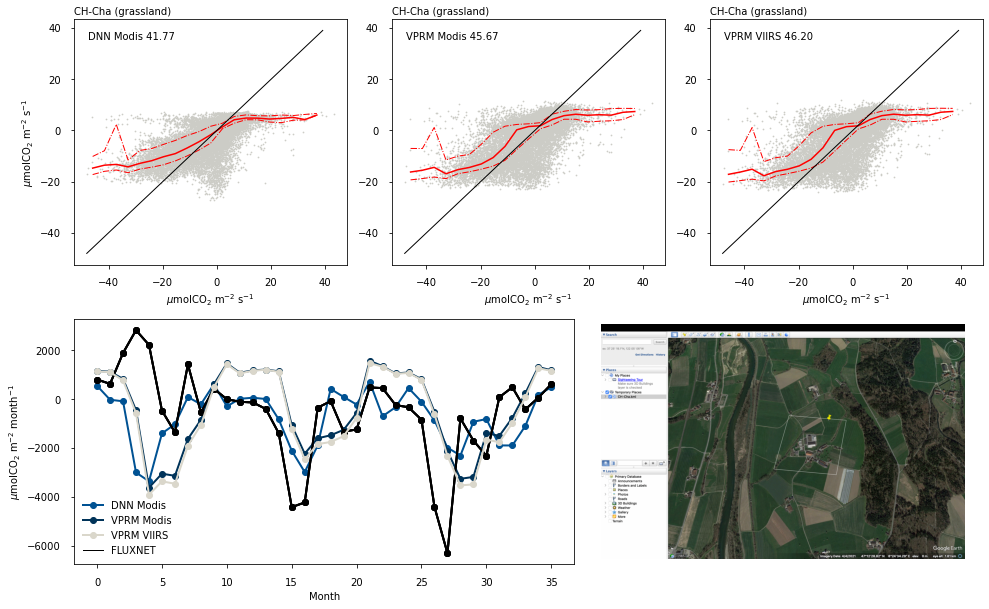

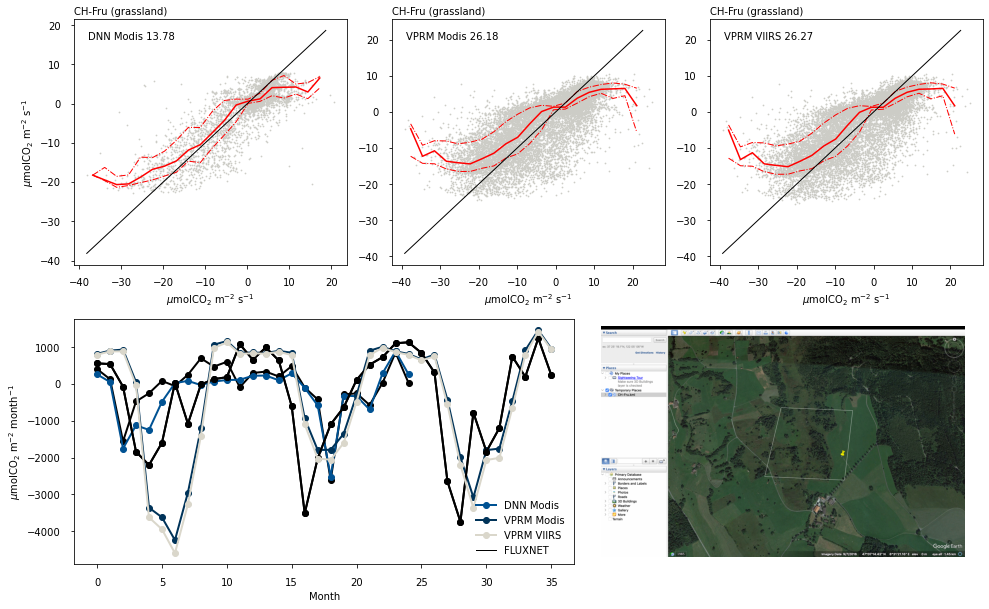

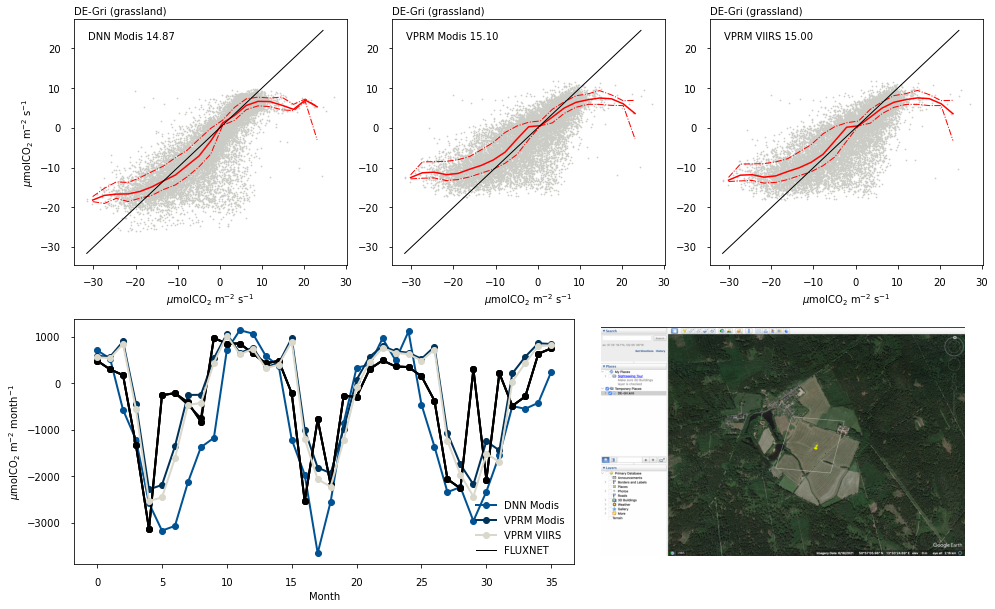

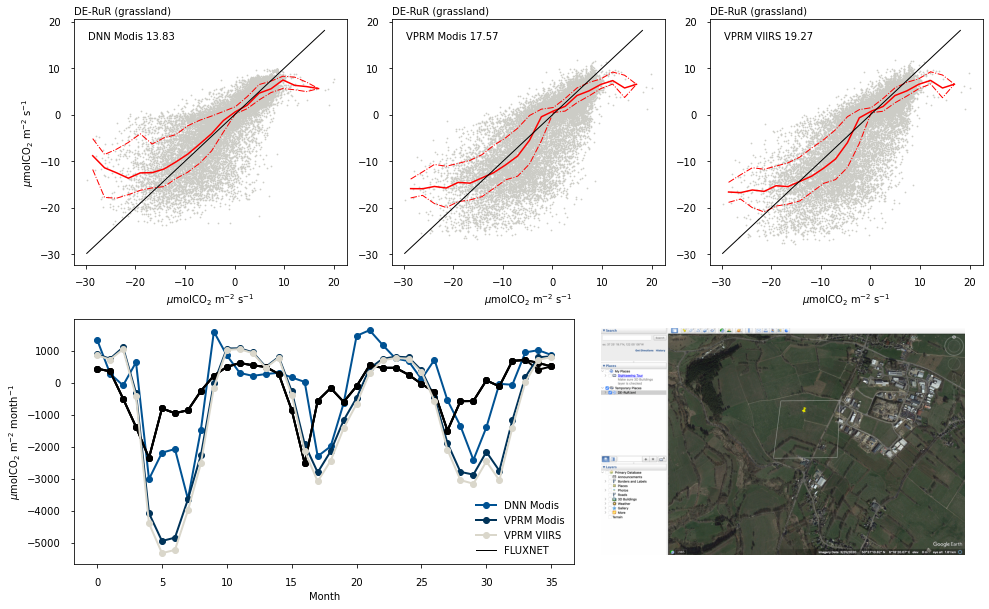

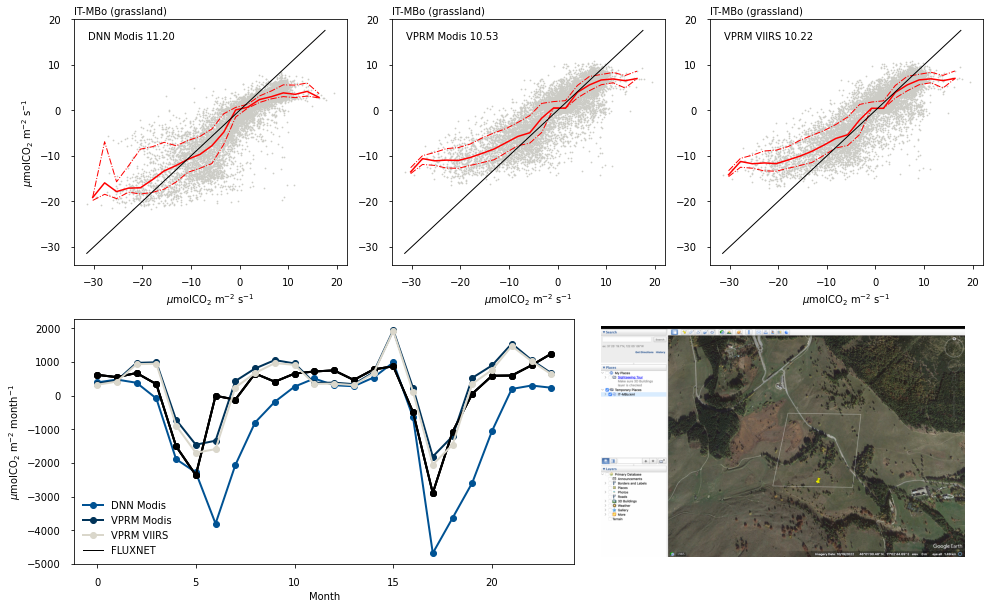

...

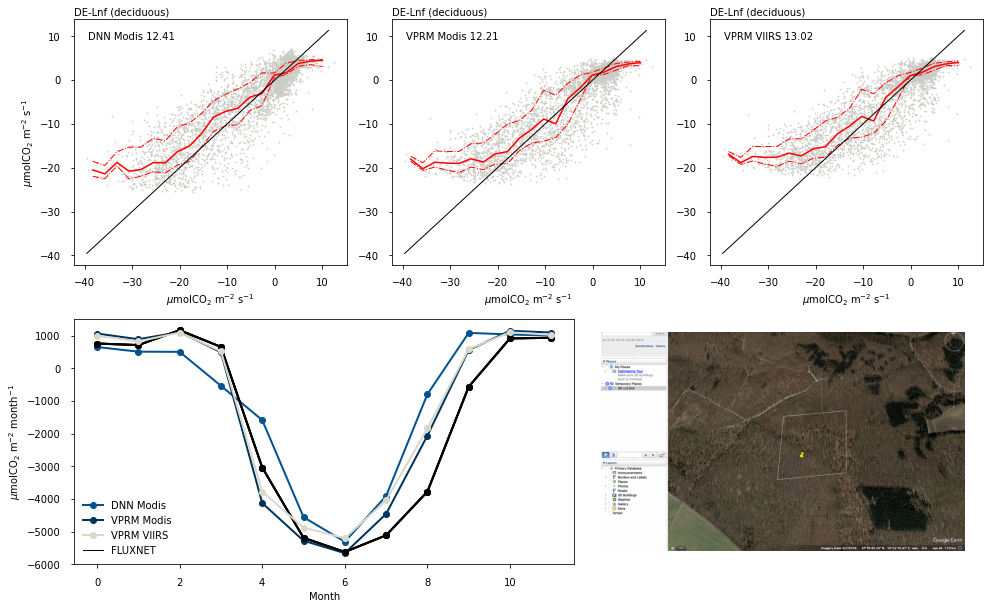

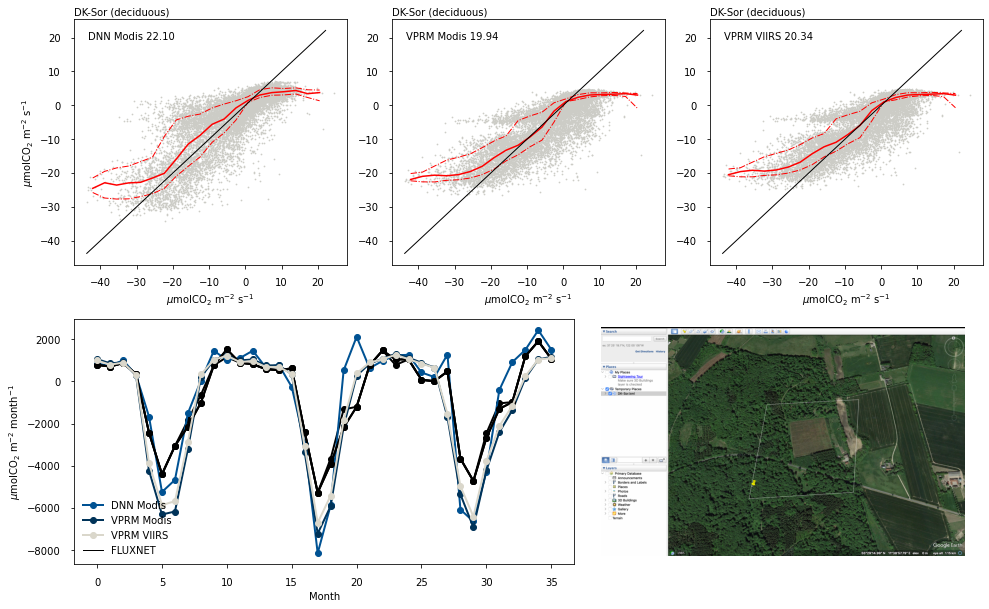

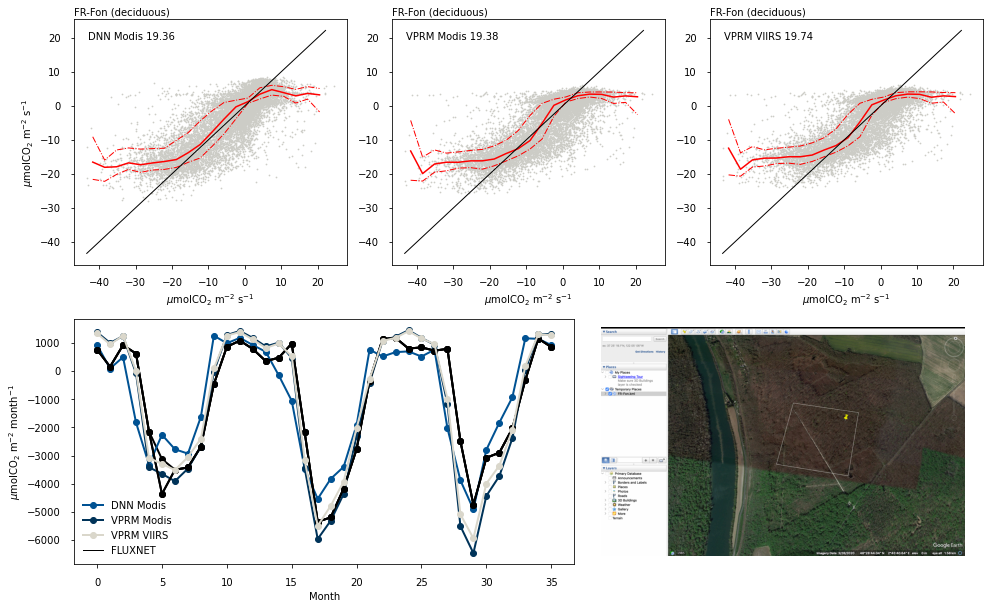

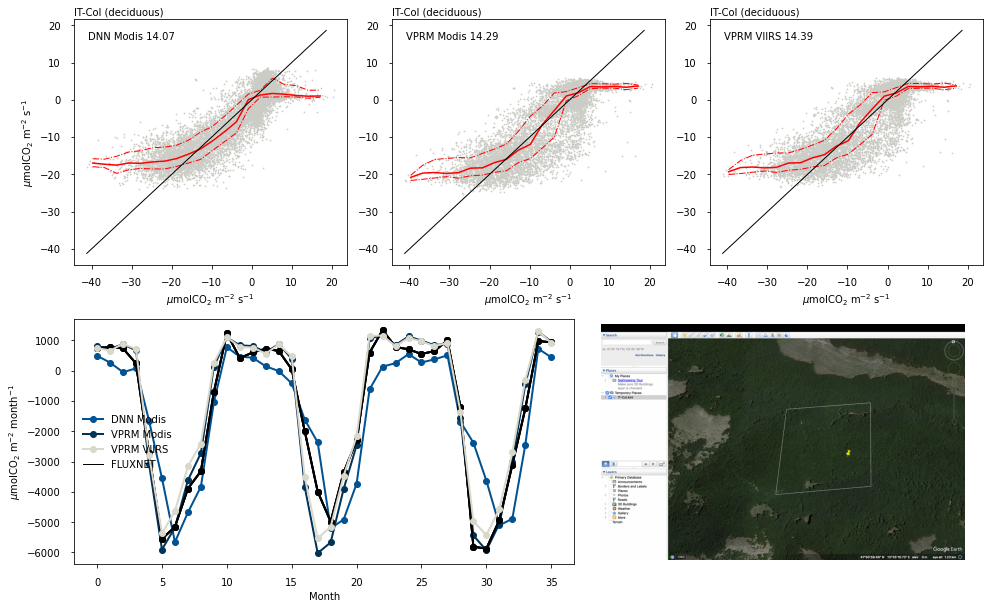

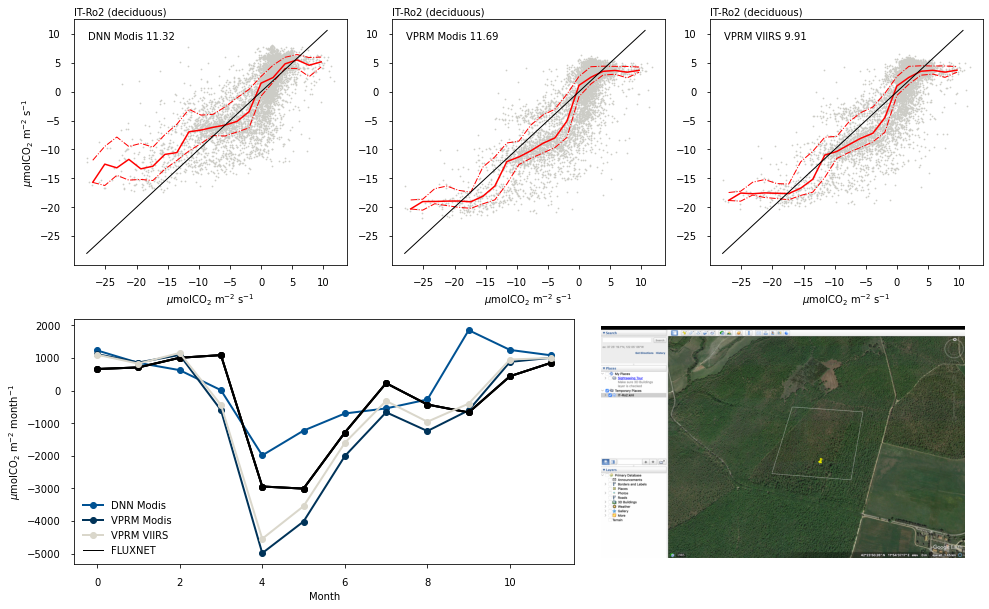

In [13]:
### data_x_all = gpps[inds]
# data_y_all = predictions[0].flatten() 
# tsites = sites[inds]
which_flux = 'nee'

for s in test_results.keys(): # 
    im = plt.imread(get_sample_data('/home/b/b309233/software/VPRM_preprocessor/site_images/{}.png'.format(s)))
    fig = plt.figure(figsize=figsize(2.0, 0.6))
    ax1 = fig.add_axes((0.0, 0.55, 0.3, 0.45))
    ax2 = fig.add_axes((0.35, 0.55, 0.3, 0.45))
    ax3 = fig.add_axes((0.7, 0.55, 0.3, 0.45))
    ax_time = fig.add_axes((0.0, 0.0, 0.55, 0.45))
    ax_img = fig.add_axes((0.58, 0.0, 0.4, 0.45))
    scatter_axes = [ax1, ax2, ax3]
    for key in site_dict.keys():
        if s in site_dict[key]:
            v_type = key
            break
    for c, tdict in enumerate([(test_results,'DNN Modis'),
                               (modis_dict, 'VPRM Modis'),
                               (viirs_dict, 'VPRM VIIRS')]):
        data_x = tdict[0][s]['target_{}'.format(which_flux)]
        data_y = tdict[0][s]['pred_{}'.format(which_flux)]
        mask = np.isfinite(data_x) & np.isfinite(data_y) & (tdict[0][s]['nee_qc'] <= 1)
        data_x = data_x[mask]
        data_y = data_y[mask]
        mse = np.mean((data_x - data_y)**2)
        print(mse)

        plt_dict = {r'95': [], r'5': [], r'50': [],
                    r'84': [], r'26': [],'bins': []}
        bins_y = np.linspace(np.min(data_y), np.max(data_y), 21)
        bins_x = np.linspace(np.min(data_x), 0.9 * np.max(data_x), 21)
        for i in range(len(bins_x)-1):
            temp_mask = (data_x >= bins_x[i]) & (data_x < bins_x[i+1])
            temp_df = data_y[temp_mask]
            if len(temp_df) == 0:
                continue
            for q_key in plt_dict.keys():
                if q_key == 'bins':
                    plt_dict['bins'].append((bins_x[i]+bins_x[i+1])/2)
                    continue
                plt_dict[q_key].append(np.percentile(temp_df, float(q_key)))

        scatter_axes[c].plot(plt_dict['bins'], plt_dict['50'], color='red', lw=1.5)
        scatter_axes[c].plot(plt_dict['bins'], plt_dict['26'], color='red', ls='-.')
        scatter_axes[c].plot(plt_dict['bins'], plt_dict['84'], color='red', ls='-.') 
        scatter_axes[c].plot([bins_x[0], bins_x[-1]], [bins_x[0], bins_x[-1]], color='k')
        scatter_axes[c].scatter(data_x, data_y, color=colors[8], s=0.5)
        scatter_axes[c].text(0.0, 1.01, '{} ({})'.format(s, v_type),
                             horizontalalignment='left',
                             verticalalignment='bottom',
                             transform = scatter_axes[c].transAxes)
        scatter_axes[c].text(0.05, 0.95, '{} {:.2f}'.format(tdict[1], mse),
                             horizontalalignment='left',
                             verticalalignment='top',
                             transform = scatter_axes[c].transAxes)
        scatter_axes[c].set_xlabel(r'$\mu$molCO$_{2}$ m$^{-2}$ s$^{-1}$ ')
        if c == 0:
            scatter_axes[c].set_ylabel(r'$\mu$molCO$_{2}$ m$^{-2}$ s$^{-1}$')           
    
    for count, tdict in enumerate([(test_results,'DNN Modis'),
                               (modis_dict, 'VPRM Modis'),
                               (viirs_dict, 'VPRM VIIRS')]):
        t_gpps = tdict[0][s]['target_{}'.format(which_flux)]
        predictions = tdict[0][s]['pred_{}'.format(which_flux)]
        t_timestamps = tdict[0][s]['timestamps']
        mask = np.isfinite(predictions)  #& (test_results[s]['nee_qc']<=1)
        t_gpps = t_gpps[mask]
        predictions = predictions[mask]
        t_timestamps = t_timestamps[mask]

        month_values_pred = []
        temp_values_pred = []  
        month_values_truth = []
        temp_values_truth = [] 
        c_month = int(str(t_timestamps[0])[4:6])
        for c, i in enumerate(t_timestamps):
            if int(str(t_timestamps[c])[4:6]) != c_month:
                c_month = int(str(t_timestamps[c])[4:6])
                month_values_pred.append(np.sum(np.array(temp_values_pred)))
                month_values_truth.append(np.sum(np.array(temp_values_truth)))
                temp_values_truth = [] 
                temp_values_pred = []
            temp_values_pred.append(predictions[c])
            temp_values_truth.append(t_gpps[c])

        ax_time.plot(range(len(month_values_truth)), month_values_truth, color='k',
             marker='o', lw=2)
        ax_time.plot(range(len(month_values_pred)), month_values_pred, color=colors[count+1],
         marker='o', label=tdict[1], lw=2)
    ax_time.plot([],[], color='k', label='FLUXNET')
    ax_time.legend(loc='best', frameon=False)
    ax_time.set_ylabel(r'$\mu$molCO$_{2}$ m$^{-2}$ month$^{-1}$')           
    ax_time.set_xlabel(r'Month')

    ax_img.imshow(im)
    ax_img.axis('off')
    fig.savefig('./plots/no_veg_type_{}.jpg'.format(s), dpi=300, bbox_inches='tight')
    fig.show()

DE-Geb
IT-CA1
CH-Lae


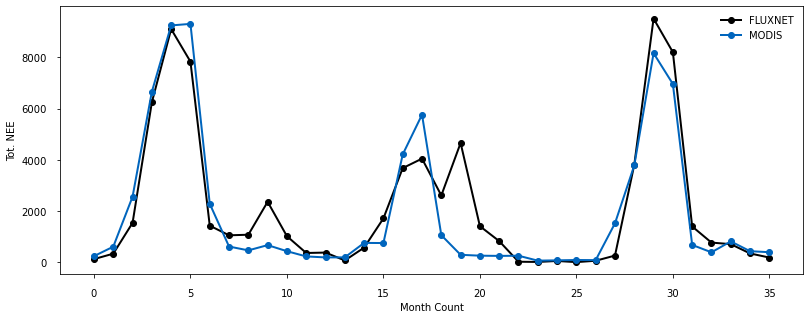

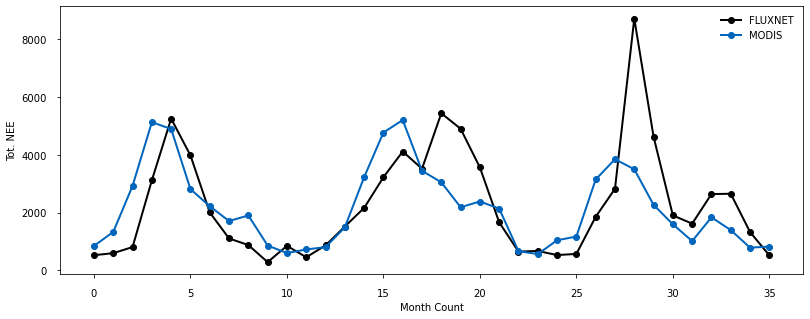

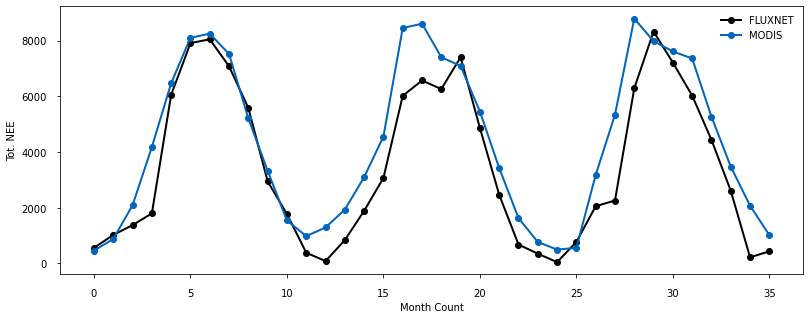

In [18]:
for s in test_results.keys():
    print(s)

 
    t_gpps = test_results[s]['target_gpp']
    predictions = test_results[s]['pred_gpp']
    t_timestamps = test_results[s]['timestamps']
    mask = np.isfinite(predictions)  #& (test_results[s]['nee_qc']<=1)
    t_gpps = t_gpps[mask]
    predictions = predictions[mask]
    t_timestamps = t_timestamps[mask]
    
    
    fig, ax = newfig(1.8, ratio=0.4)
    month_values_pred = []
    temp_values_pred = []  
    month_values_truth = []
    temp_values_truth = [] 
    c_month = int(str(t_timestamps[0])[4:6])
    for c, i in enumerate(t_timestamps):
        if int(str(t_timestamps[c])[4:6]) != c_month:
            c_month = int(str(t_timestamps[c])[4:6])
            month_values_pred.append(np.sum(np.array(temp_values_pred)))
            month_values_truth.append(np.sum(np.array(temp_values_truth)))
            temp_values_truth = [] 
            temp_values_pred = []
        temp_values_pred.append(predictions[c])
        temp_values_truth.append(t_gpps[c])

    ax.plot(range(len(month_values_truth)), month_values_truth, color='k',
         marker='o', label='FLUXNET', lw=2)
    ax.plot(range(len(month_values_pred)), month_values_pred, color=colors[0],
     marker='o', label='MODIS', lw=2)
    ax.legend(loc='best', frameon=False)
    ax.set_ylabel('Tot. NEE')
    ax.set_xlabel('Month Count')
    fig.show()


In [11]:
model.save('/home/b/b309233/software/VPRM_preprocessor/neural_network/model02.h5')

In [53]:
help(model.save)

Help on method save in module keras.engine.training:

save(filepath, overwrite=True, include_optimizer=True, save_format=None, signatures=None, options=None, save_traces=True) method of keras.engine.functional.Functional instance
    Saves the model to Tensorflow SavedModel or a single HDF5 file.
    
    Please see `tf.keras.models.save_model` or the
    [Serialization and Saving guide](
    https://keras.io/guides/serialization_and_saving/)
    for details.
    
    Args:
        filepath: String, PathLike, path to SavedModel or H5 file to save
            the model.
        overwrite: Whether to silently overwrite any existing file at the
            target location, or provide the user with a manual prompt.
        include_optimizer: If True, save optimizer's state together.
        save_format: Either `'tf'` or `'h5'`, indicating whether to save the
            model to Tensorflow SavedModel or HDF5. Defaults to 'tf' in TF
            2.X, and 'h5' in TF 1.X.
        signatures: S

In [65]:
t = np.array([[[1,2,3],[3,4,5]], [[3,7,8], [2,9,5]]])

In [69]:
t

array([[[1, 2, 3],
        [3, 4, 5]],

       [[3, 7, 8],
        [2, 9, 5]]])

In [73]:
dnn_model = '/home/b/b309233/software/VPRM_preprocessor/neural_network/model01.py'

In [74]:
from keras.models import load_model
model = load_model('/home/b/b309233/software/VPRM_preprocessor/neural_network/model01.h5')

In [56]:
model

In [57]:
import pathlib

In [64]:
pathlib.Path().parts[-1]

'model01.py'

In [86]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("model", dnn_model)
foo = importlib.util.module_from_spec(spec)
sys.modules["model"] = foo
spec.loader.exec_module(foo)
foo.model_name
foo.CustomDataGen

'home/b/b309233/software/VPRM_preprocessor/neural_network/model01.h5'

In [107]:
t = np.random.uniform(size=(10, 24, 24)).T

In [108]:
np.shape(t)

(24, 24, 10)

In [101]:
np.shape(t.reshape(24*24,10))

(576, 10)

In [ ]:
numpy.rollaxis(t, 0, start=0)

In [14]:
import sys
import os
import pathlib
sys.path.append(os.path.join('/home/b/b309233/software/VPRM_preprocessor/', 'lib'))
from fancy_plot import *
import sys
import os
import xarray as xr
import glob
import argparse


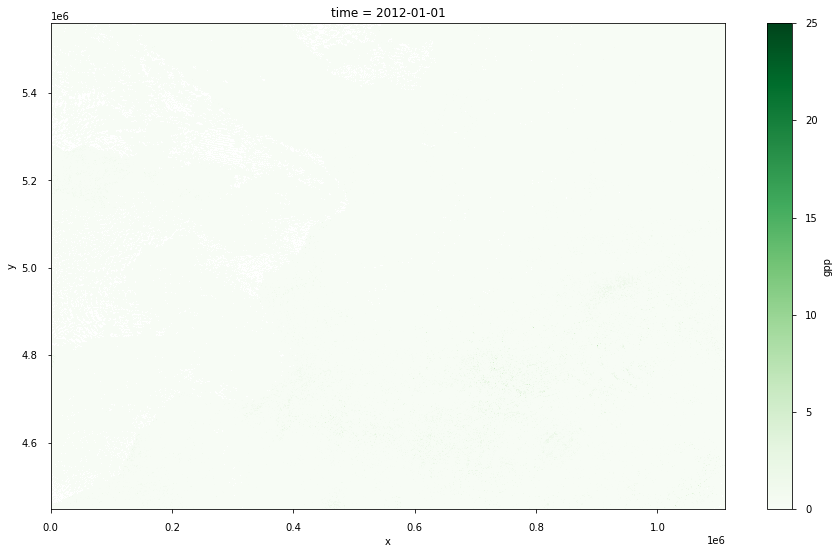

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21


/home/b/b309233/software/VPRM_preprocessor/lib/fancy_plot.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize(width, ratio))


22
23


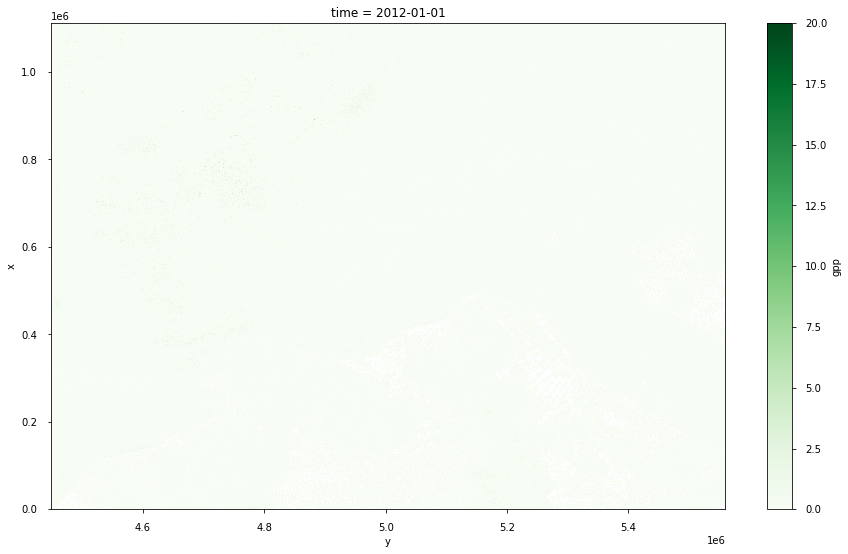

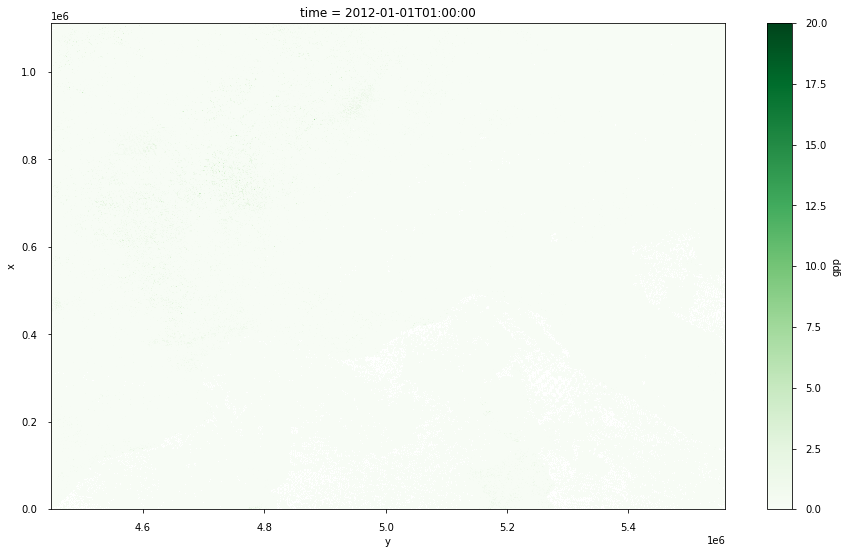

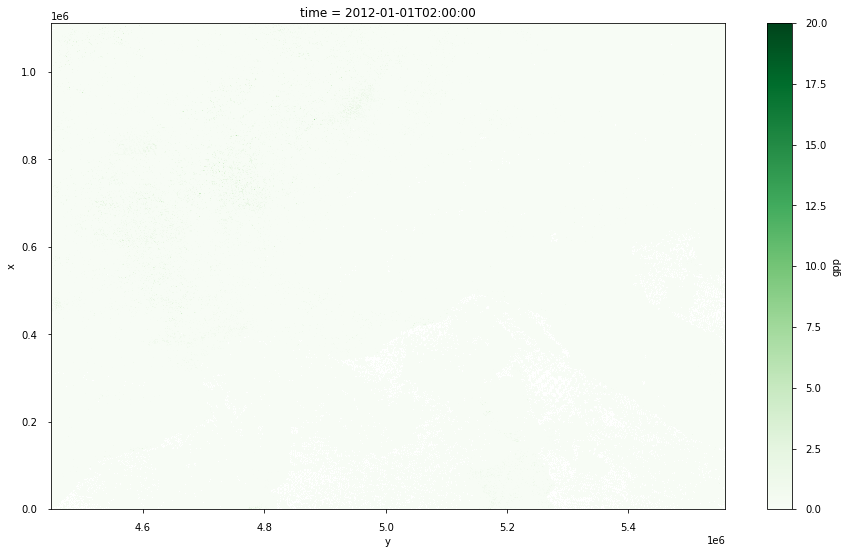

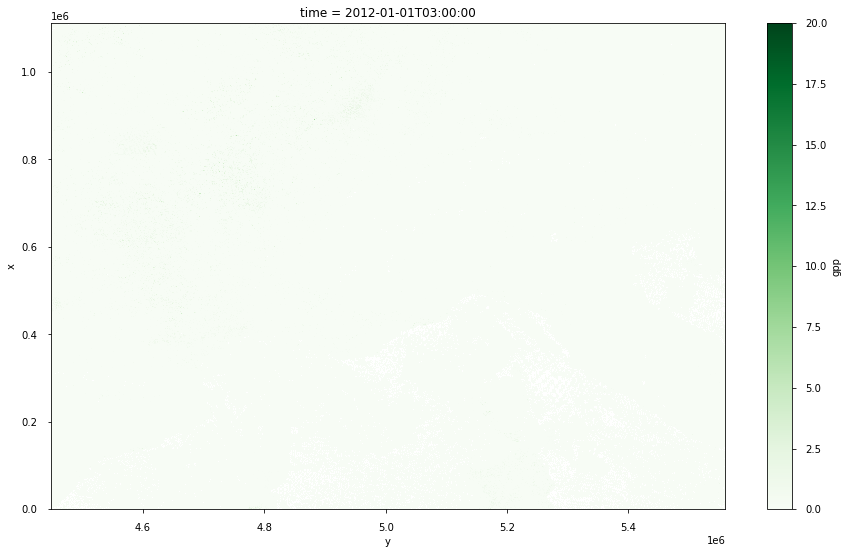

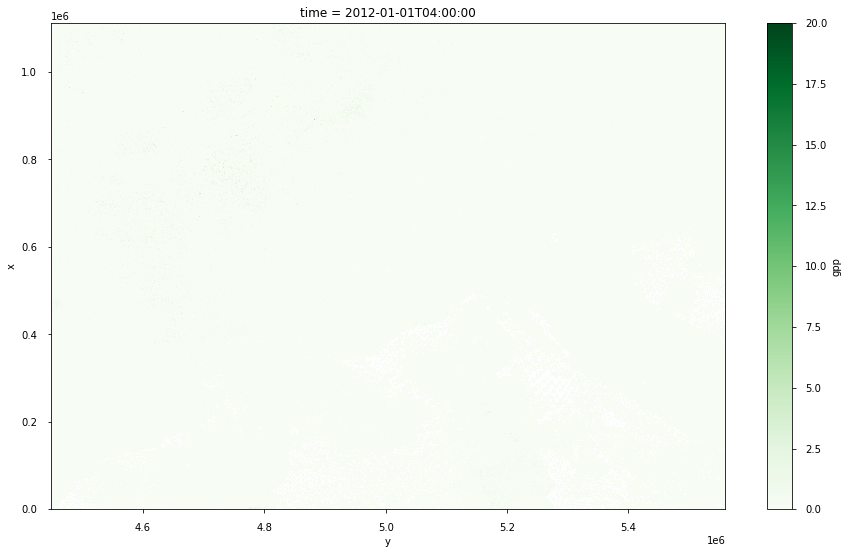

...

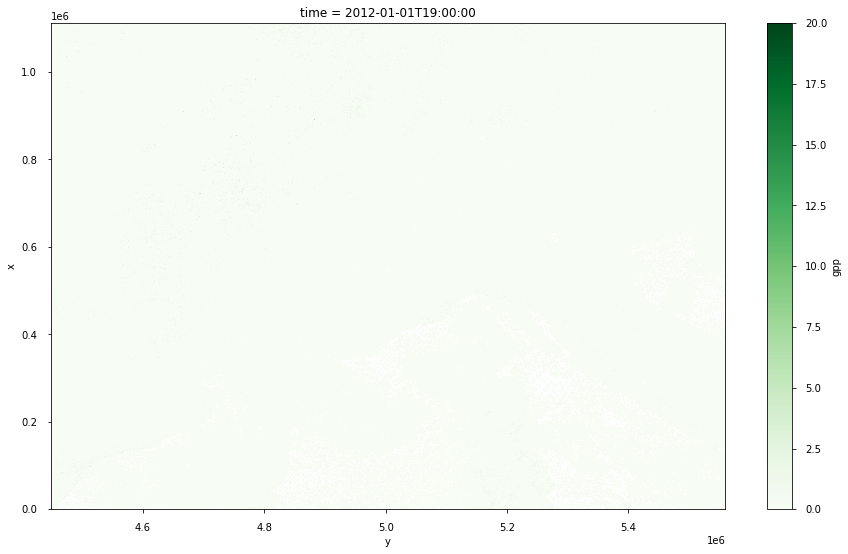

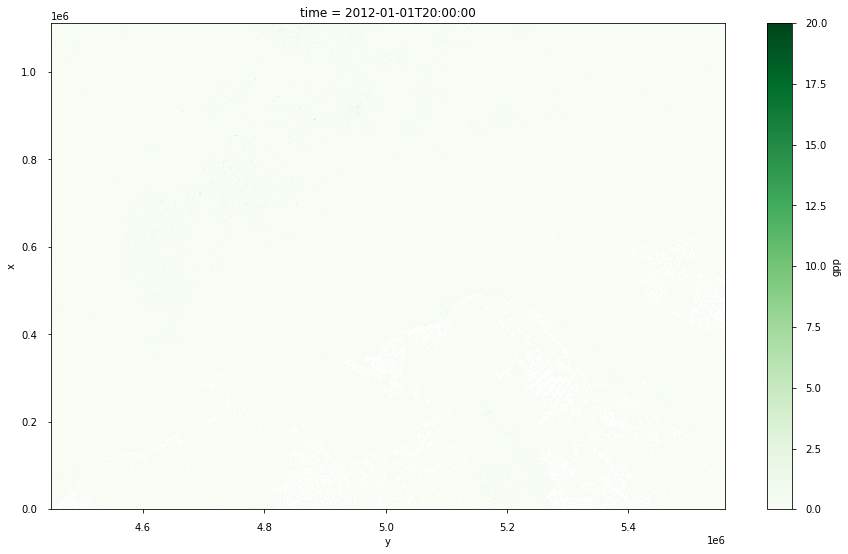

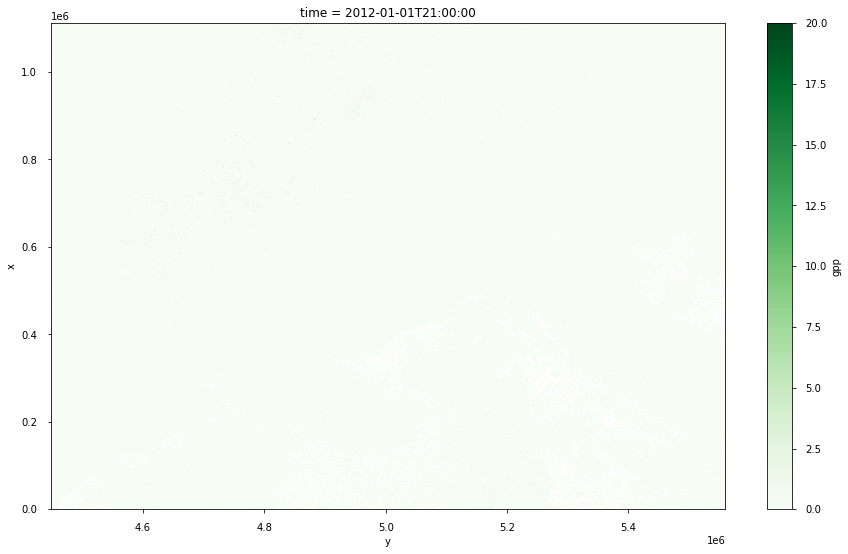

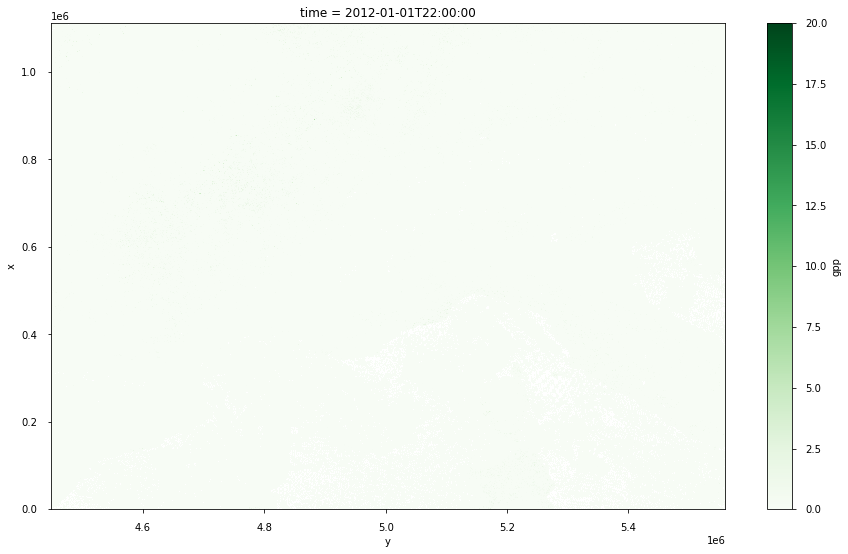

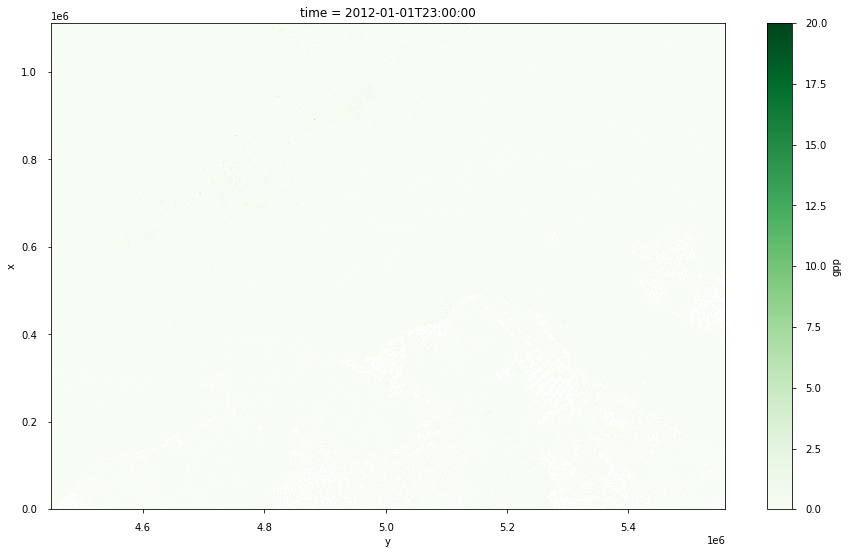

In [25]:
merged = xr.open_dataset('/work/bd1231/tglauch/gpp_eu_modis/h18v04_001_nn.h5')
for j in range(24):
    print(j)
    fig, ax = newfig(2.0)
    merged['gpp'].isel({'time': j}).plot.imshow(x='y', y='x', cmap='Greens',
                                                vmin=0, vmax=20, ax=ax)
    fig.show()